# Zbieranie danych
Na początku ustalamy przedział czasowy, z którego chcemy zebrać dane 
i korzystamy z pakietu data_preparing, żeby je uzyskać.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium

from collections import defaultdict, Counter
from sklearn_extra.cluster import KMedoids

from bus_project.data_classes.point import Point
from bus_project.data_preparing.prepare_data import get_prepared_data
from bus_project.data_analysis.punctuality_analysis import get_punctuality
from bus_project.data_analysis.speeding_analysis import get_speeding_analysis
from bus_project.config.config import get_warsaw_latitude, get_warsaw_longitude


GET_DISTRICTS = True
WARSAW_LATITUDE = get_warsaw_latitude()
WARSAW_LONGITUDE = get_warsaw_longitude()

start_time = pd.Timestamp(year=2024, month=2, day=19, hour=10)
end_time = pd.Timestamp(year=2024, month=2, day=19, hour=11)

prepared_data = get_prepared_data(start_time, end_time, GET_DISTRICTS)

bus_id_list = prepared_data['bus_id_list']
bus_id_list_len = len(bus_id_list)
bus_stop_list = prepared_data['bus_stop_list']

# Analiza prędkości

In [2]:
speeding_data = get_speeding_analysis(prepared_data)

In [3]:
distinct_buses = len(speeding_data['distinct_buses'])
speeding_count = speeding_data['speeding_count']
measured_count = speeding_data['number_measured']
rejected_count = speeding_data['number_rejected']

district_speeding_points = speeding_data['district_speeding_points']

speeding_percentage = (speeding_count / measured_count) * 100

rejected_percentage = (rejected_count / (measured_count + rejected_count)) * 100

print(f"Procent odrzuconych zmierzeń: {rejected_percentage:.2f}")
print(f"Liczba autobusów, które przekroczyły 50 km/h: {distinct_buses}")
print(f"Liczba wszyskich zmierzonych przemieszczeń: {measured_count}")
print(f"Liczba wszystkich przekroczeń: {speeding_count}")
print(f"Procent przekroczeń względem przemieszczeń: {speeding_percentage:.2f}")

Procent odrzuconych zmierzeń: 0.11
Liczba autobusów, które przekroczyły 50 km/h: 955
Liczba wszyskich zmierzonych przemieszczeń: 212539
Liczba wszystkich przekroczeń: 3830
Procent przekroczeń względem przemieszczeń: 1.80


## Przekroczenia prędkości na mapie Warszawy

In [4]:
warsaw_map = folium.Map(location=[WARSAW_LATITUDE, WARSAW_LONGITUDE], zoom_start=10)

for point, bus in zip(speeding_data['speeding_points'], speeding_data['speeding_buses']):
    folium.CircleMarker(
        [point.latitude, point.longitude],
        radius=5,
        color='yellow',
        fill=True,
        popup=f"Bus number: {bus}",
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(warsaw_map)

warsaw_map

## Czy istnieją autobusy, które przekroczyły prędkość więcej niż 15 razy?

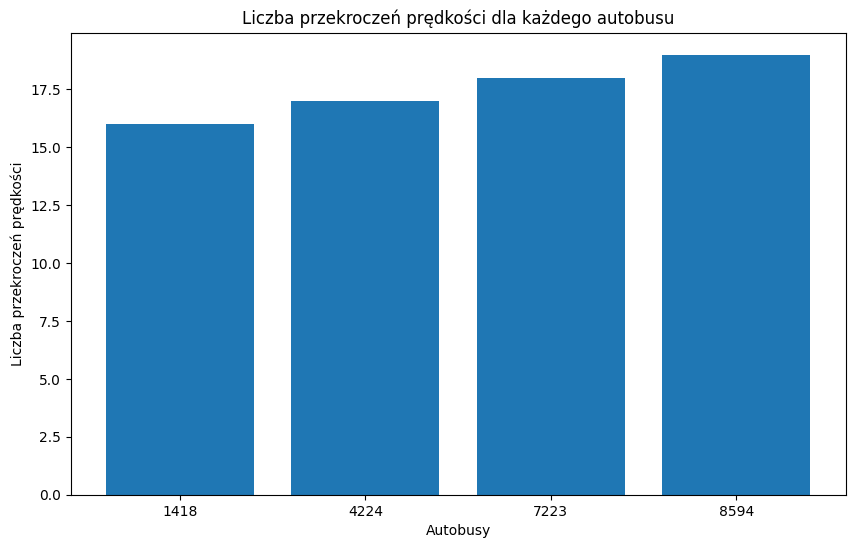

In [5]:
count_times = np.zeros(bus_id_list_len)
nr_to_idx = speeding_data['nr_to_idx']
idx_to_nr = speeding_data['idx_to_nr']

for bus in speeding_data['speeding_buses']:
    count_times[nr_to_idx[bus]] += 1

positive_ids = [count_times[i] > 15 for i in range(bus_id_list_len)]
bus_ids = [f"{idx_to_nr[i]}" for i in range(bus_id_list_len) if positive_ids[i]]

plt.figure(figsize=(10, 6))
plt.bar(bus_ids, count_times[positive_ids])
plt.xlabel('Autobusy')
plt.ylabel('Liczba przekroczeń prędkości')
plt.title('Liczba przekroczeń prędkości dla każdego autobusu')

plt.show()

## Ile razy autobusy przekraczają prędkość?

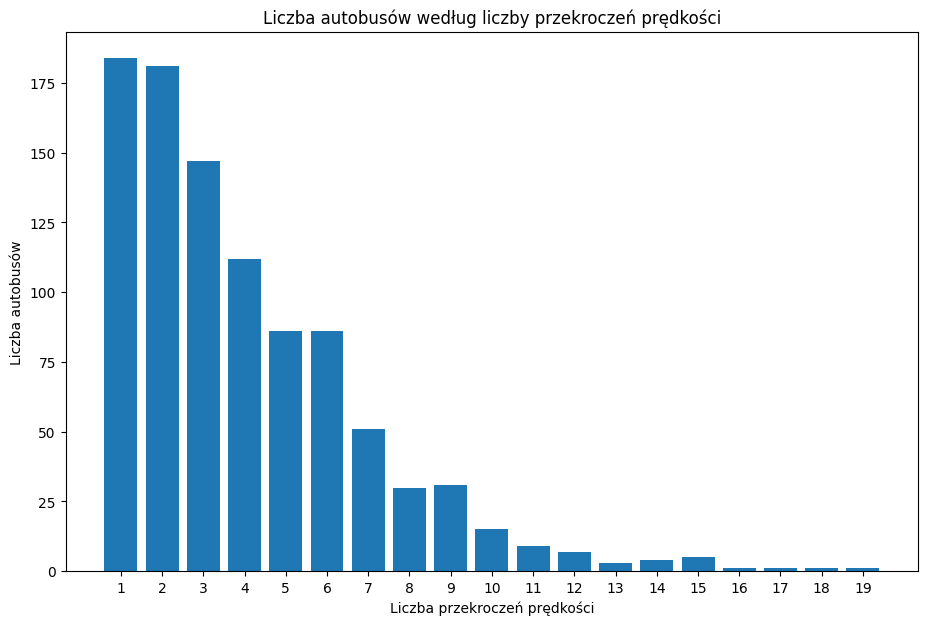

In [6]:
max_count = int(np.max(count_times))

how_many_buses = np.zeros(max_count + 1)
for i in range(bus_id_list_len):
    if count_times[i] > 0:
        how_many_buses[int(count_times[i])] += 1

non_zero_counts = np.where(how_many_buses > 0)[0]

plt.figure(figsize=(11, 7))
plt.bar(non_zero_counts, how_many_buses[non_zero_counts])
plt.title('Liczba autobusów według liczby przekroczeń prędkości')
plt.xlabel('Liczba przekroczeń prędkości')
plt.ylabel('Liczba autobusów')
plt.xticks(np.arange(min(non_zero_counts), max(non_zero_counts)+1, 1))

plt.show()

## W których dzielnicach najwięcej przekraczono prędkość

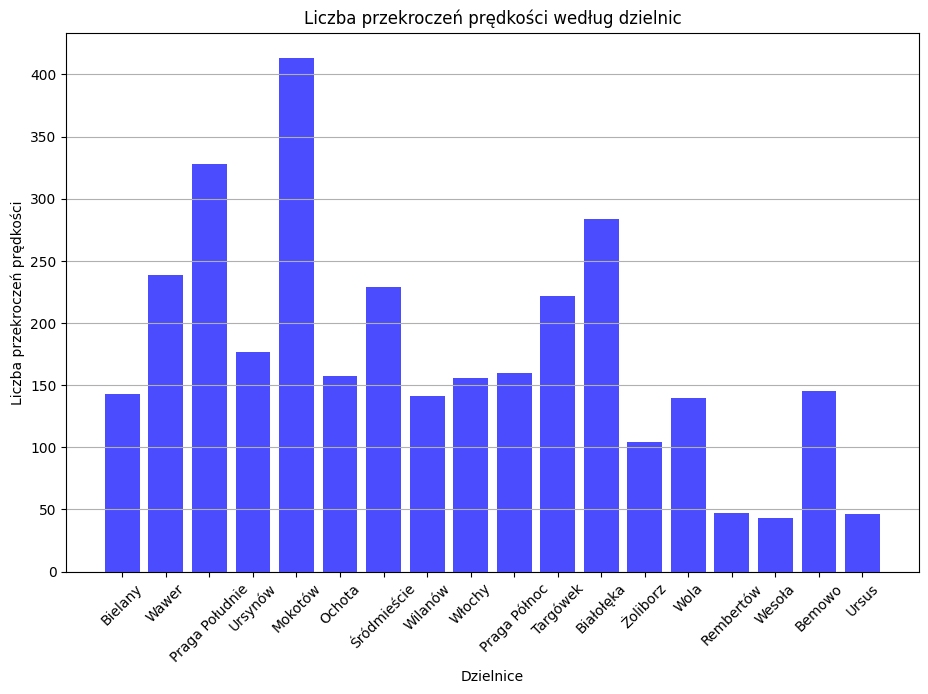

In [7]:
speeding_counts = list(district_speeding_points.values())

districts = list(district_speeding_points.keys())
speeding_counts = list(district_speeding_points.values())

plt.figure(figsize=(11, 7))
plt.bar(districts, speeding_counts, color='blue', alpha=0.7)
plt.title('Liczba przekroczeń prędkości według dzielnic')
plt.xlabel('Dzielnice')
plt.ylabel('Liczba przekroczeń prędkości')
plt.xticks(rotation=45)
plt.grid(axis='y')

plt.show()

## Jaki jest rozkład prędkości?

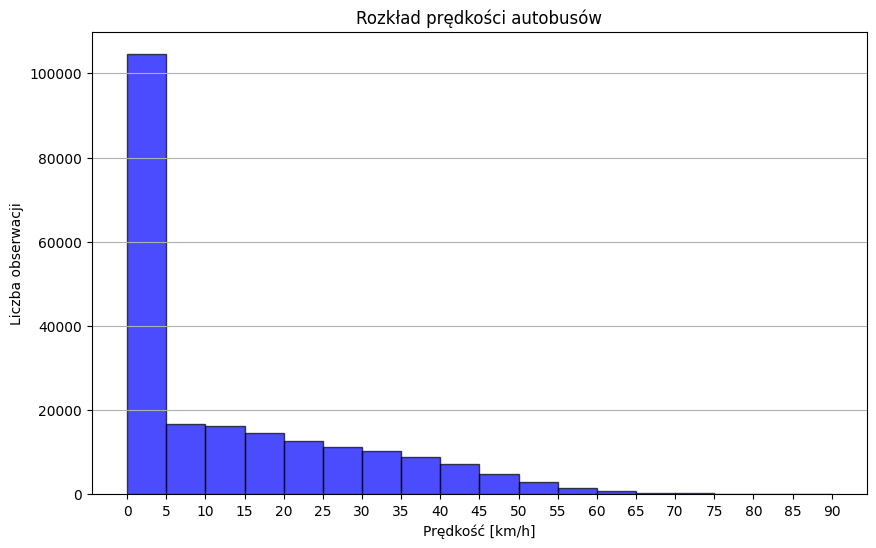

Średnia prędkość autobusów: 12.99 km/h


In [8]:
speed_array = speeding_data['speed_array']

plt.figure(figsize=(10, 6))
plt.hist(speed_array, bins=range(0, 91, 5), color='blue', alpha=0.7, edgecolor='black')
plt.title('Rozkład prędkości autobusów')
plt.xlabel('Prędkość [km/h]')
plt.ylabel('Liczba obserwacji')
plt.grid(axis='y')
plt.xticks(range(0, 91, 5))

plt.show()

average_speed = np.mean(speed_array)
print(f"Średnia prędkość autobusów: {average_speed:.2f} km/h")

## Analiza miejsc, gdzie najczęściej przekraczano prędkość

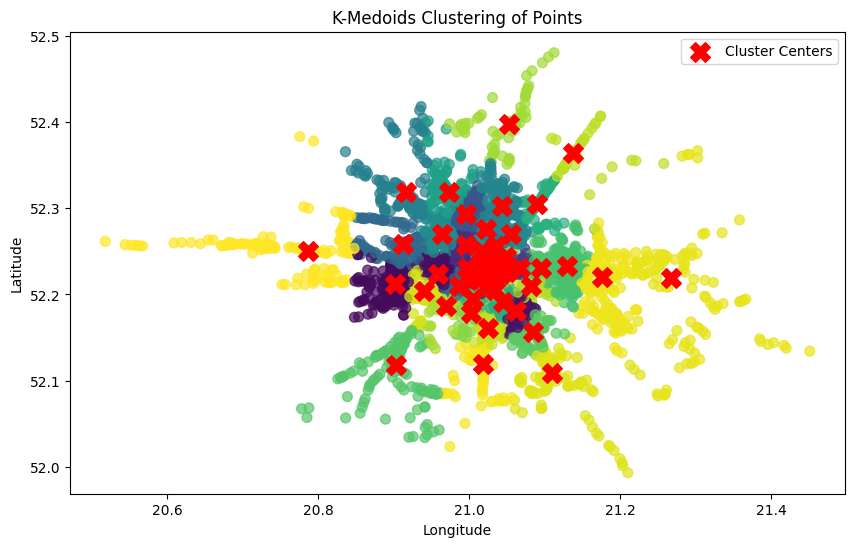

In [9]:
latitude = np.array([point.latitude for point in speeding_data['speeding_points']])
longitude = np.array([point.longitude for point in speeding_data['speeding_points']])
coordinates = np.column_stack((latitude, longitude))
num_clusters = 80

kmedoids = KMedoids(n_clusters=num_clusters, random_state=42)
kmedoids.fit(coordinates)

labels = kmedoids.labels_
centers = kmedoids.cluster_centers_

plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, c=labels, cmap='viridis', s=50, alpha=0.7)
plt.scatter(centers[:, 1], centers[:, 0], c='red', marker='X', s=200, label='Cluster Centers')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-Medoids Clustering of Points')
plt.legend()

plt.show()

## Wizualizacja algorytmu K-Medoids na mapie Warszawy

In [10]:
warsaw_map = folium.Map(location=[WARSAW_LATITUDE, WARSAW_LONGITUDE], zoom_start=10)

colors = [
    'red', 'blue', 'gray', 'darkred', 'lightred', 'orange', 'beige','green', 'darkgreen','lightgreen',
    'darkblue', 'lightblue', 'purple', 'darkpurple', 'pink', 'cadetblue', 'lightgray', 'black'
]


cluster_color = [colors[np.random.randint(0, len(colors))] for i in range(num_clusters)]
cluster_fill_color = [colors[np.random.randint(0, len(colors))] for i in range(num_clusters)]

for lat, lon, cluster, bus in zip(latitude, longitude, labels, speeding_data['speeding_buses']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=cluster_color[cluster],
        fill=True,
        popup=f"Bus number: {bus}, Cluster: {cluster}",
        fill_color=cluster_fill_color[cluster],
        fill_opacity=0.6
    ).add_to(warsaw_map)

warsaw_map

# Analiza punktualności

In [11]:
punctuality_data = get_punctuality(prepared_data)

## Jaki jest rozkład spóźnień?

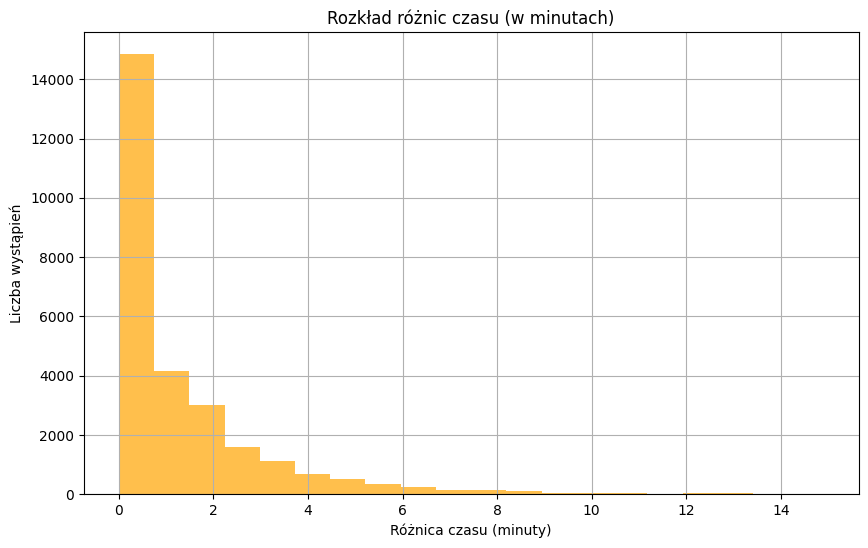

In [12]:
late_times = punctuality_data['late_times']

plt.figure(figsize=(10, 6))
plt.hist(late_times, bins=20, color='orange', alpha=0.7)
plt.title('Rozkład różnic czasu (w minutach)')
plt.xlabel('Różnica czasu (minuty)')
plt.ylabel('Liczba wystąpień')
plt.grid(True)

plt.show()

## Jaki jest rozkład spóźnień w poszczególnych dzielnicach

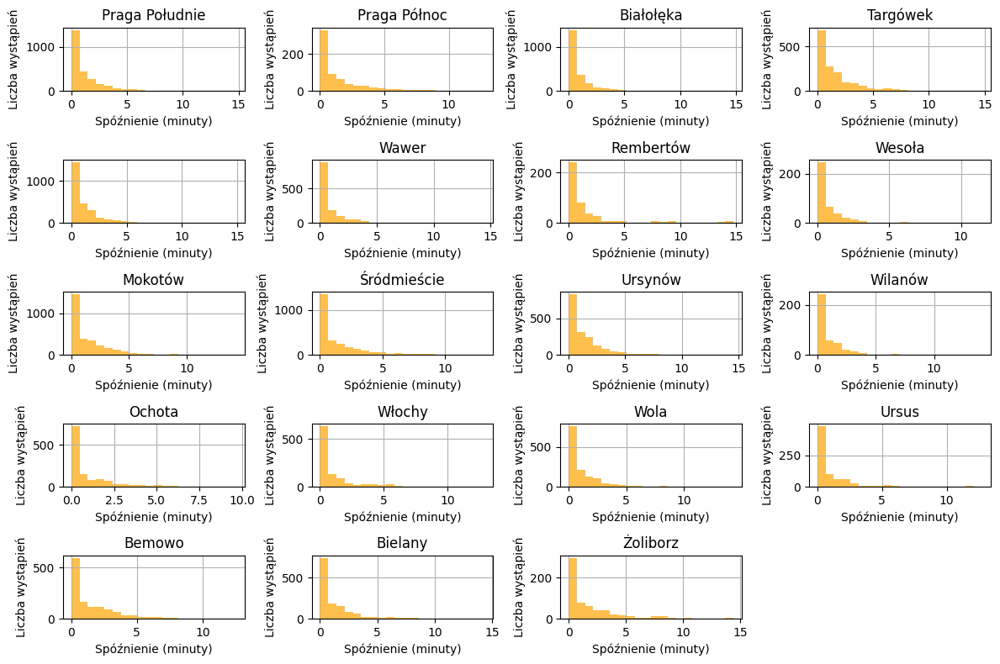

In [13]:
district_late_times = punctuality_data['district_late_times']
num_districts = len(district_late_times)
num_cols = 4

num_rows = (num_districts + num_cols - 1) // num_cols

plt.figure(figsize=(12, 8))

for i, (district, late_times) in enumerate(district_late_times.items(), 1):
    plt.subplot(num_rows, num_cols, i)
    plt.hist(late_times, bins=20, alpha=0.7, color='orange')
    plt.title(f'{district}')
    plt.xlabel('Spóźnienie (minuty)')
    plt.ylabel('Liczba wystąpień')
    plt.grid(True)

plt.tight_layout()
plt.show()

## Liczba spóźnień w poszczególnych dzielnicach

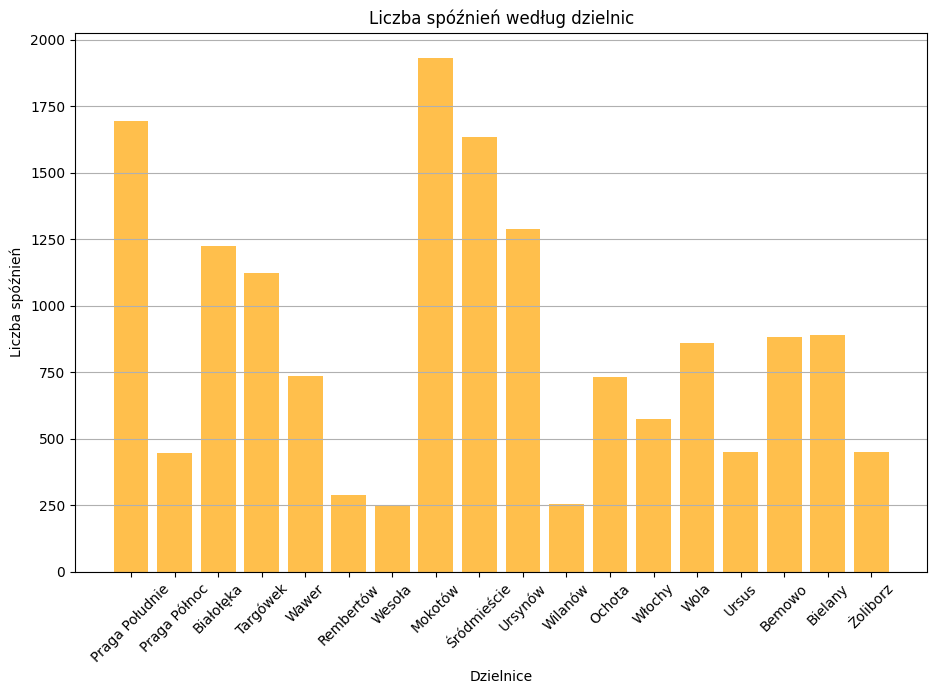

In [14]:
district_late_dict = punctuality_data['district_late_dict']

districts = list(district_late_dict.keys())
district_late_counts = list(district_late_dict.values())


plt.figure(figsize=(11, 7))
plt.bar(districts, district_late_counts, color='orange', alpha=0.7)
plt.title('Liczba spóźnień według dzielnic')
plt.xlabel('Dzielnice')
plt.ylabel('Liczba spóźnień')
plt.xticks(rotation=45)
plt.grid(axis='y')

plt.show()

## Wizualizacja przystanków, na które wszystkie autobusy były punktualnie

In [15]:
stop_positions = punctuality_data['stop_positions']

warsaw_map = folium.Map(location=[WARSAW_LATITUDE, WARSAW_LONGITUDE], zoom_start=10)

stops_included = [stop_position[1] for stop_position in stop_positions]

for bus_stop in bus_stop_list:
    stop_lat, stop_lon, stop_id = [bus_stop.get_stop_lat(), bus_stop.get_stop_lon(), bus_stop.get_stop_id()]
    
    if stop_id not in stops_included:
        folium.CircleMarker(
            location=[stop_lat, stop_lon],
            radius=5,
            color='red',
            fill=True,
            popup=f"Bus stop {stop_id}",
            fill_color='green',
            fill_opacity=0.6
        ).add_to(warsaw_map)

warsaw_map

## Jak często autobusy się spóźniały na poszczególne przystanki?

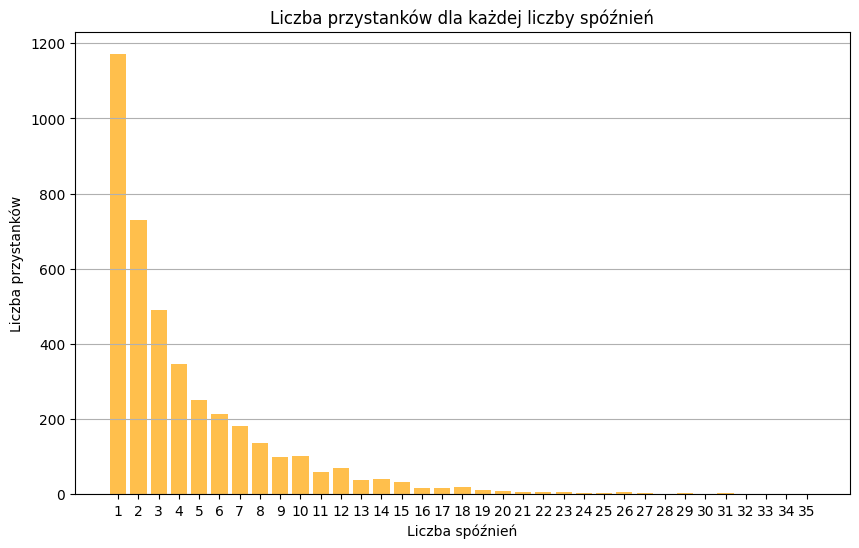

Przystanek 2098_01 miał najwięcej spóźnień: 35


In [16]:
stop_late_dict = punctuality_data['stop_late_dict']

late_counter = Counter(stop_late_dict.values())

late_count = list(late_counter.keys())
stop_count = list(late_counter.values())

plt.figure(figsize=(10, 6))
plt.bar(late_count, stop_count, color='orange', alpha=0.7)
plt.title('Liczba przystanków dla każdej liczby spóźnień')
plt.xlabel('Liczba spóźnień')
plt.ylabel('Liczba przystanków')
plt.grid(axis='y')
plt.xticks(range(1, max(late_count) + 1))

plt.show()

max_late_stop = max(stop_late_dict, key=stop_late_dict.get)
max_late_count = stop_late_dict[max_late_stop]

print(f"Przystanek {max_late_stop} miał najwięcej spóźnień: {max_late_count}")

## Jak wygląda rozkład przystanków w poszczególnych dzielnicach?

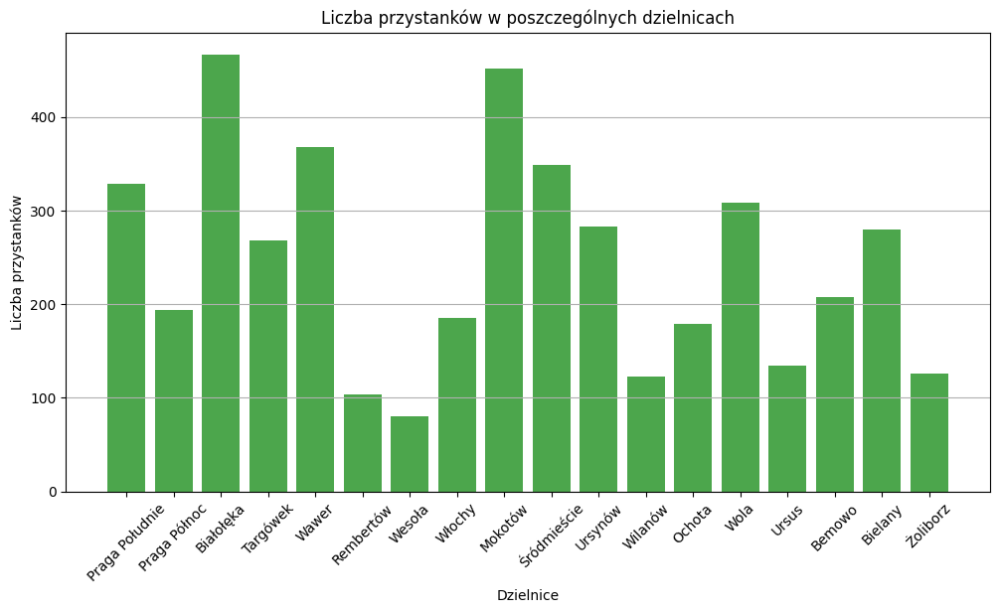

In [17]:
district_stops_count = defaultdict(int)

for stop in bus_stop_list:
    district = stop.get_stop_district()
    if district != '':
        district_stops_count[district] += 1

districts = list(district_stops_count.keys())
stops_counts = list(district_stops_count.values())

plt.figure(figsize=(12, 6))
plt.bar(districts, stops_counts, color='green', alpha=0.7)
plt.title('Liczba przystanków w poszczególnych dzielnicach')
plt.xlabel('Dzielnice')
plt.ylabel('Liczba przystanków')
plt.xticks(rotation=45)
plt.grid(axis='y')

plt.show()